In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torch.nn as nn
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
from tqdm import tqdm 

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
#for dirname, _, filenames in os.walk('/kaggle/input'):
#    for filename in filenames:
#        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In this notebook we will be using a collection of Monet art pieces and regular photos to train a generative adverserial network or GAN for short. GANs work by creating two different neural networks that compete against each other. There is a generator network and a classifier network. The generator network tries to create something and trick the classifier network into believing that it is a genuine article rather than being generated. As both of these models continue getting trained against each other the object being generated keeps improving until it is incredibly close to the real thing.

We will start with some basic analysis of the images that we are working with, first by displaying just how many images there are, and the image dimensions.

In [26]:
print("Dataset sizes:")
print(f"monet_jpg: {len(os.listdir('/kaggle/input/gan-getting-started/monet_jpg'))} images")
print(f"photo_jpg: {len(os.listdir('/kaggle/input/gan-getting-started/photo_jpg'))} images")

monet_sample = Image.open(os.path.join('/kaggle/input/gan-getting-started/monet_jpg', os.listdir('/kaggle/input/gan-getting-started/monet_jpg')[0]))
photo_sample = Image.open(os.path.join('/kaggle/input/gan-getting-started/photo_jpg', os.listdir('/kaggle/input/gan-getting-started/photo_jpg')[0]))

print("\nSample image dimensions:")
print(f"Monet image: {monet_sample.size} with {len(monet_sample.getbands())} channels")
print(f"Photo image: {photo_sample.size} with {len(photo_sample.getbands())} channels")

Dataset sizes:
monet_jpg: 300 images
photo_jpg: 7038 images

Sample image dimensions:
Monet image: (256, 256) with 3 channels
Photo image: (256, 256) with 3 channels


There seems to be far more regular photos than Monet pieces in the dataset. Next, we will load a single image from each dataset and compare.

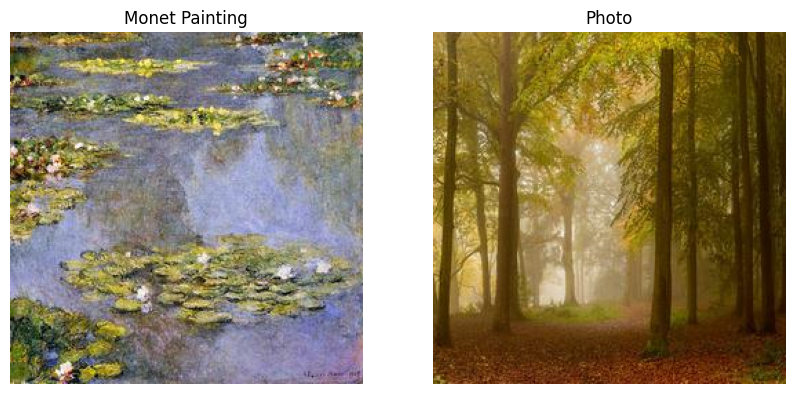

In [28]:
monet_dir = '/kaggle/input/gan-getting-started/monet_jpg'
photo_dir = '/kaggle/input/gan-getting-started/photo_jpg'

monet_img = Image.open(os.path.join(monet_dir, os.listdir(monet_dir)[0]))
photo_img = Image.open(os.path.join(photo_dir, os.listdir(photo_dir)[0]))

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(monet_img)
plt.title('Monet Painting')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(photo_img)
plt.title('Photo')
plt.axis('off')
plt.show()

Both images are quite pretty! It seems the images will consist mostly of landscapes and nature for both the Monet and photo dataset. We will now inspect the dataset for images that are corrupted and can't be opened, and images that don't fit the 256x256 RGB dimensions. We will then remove those images if they exist, thereby cleaning the dataset.

In [30]:
def check_images(directory):
    print(f"\nChecking images in {directory}...")
    corrupted = []
    wrong_size = []
    wrong_channels = []
    images = [f for f in os.listdir(directory) if f.endswith('.jpg')]
    for img_name in tqdm(images):
        path = os.path.join(directory, img_name)
        try:
            img = Image.open(path)
            img.verify()
            img = Image.open(path)
            if img.size != (256, 256):
                wrong_size.append(img_name)
            if img.mode != 'RGB':
                wrong_channels.append(img_name)    
        except:
            corrupted.append(img_name)  
    return corrupted, wrong_size, wrong_channels

monet_dir = '/kaggle/input/gan-getting-started/monet_jpg'
photo_dir = '/kaggle/input/gan-getting-started/photo_jpg'

corrupted_monet, wrong_size_monet, wrong_channels_monet = check_images(monet_dir)
corrupted_photo, wrong_size_photo, wrong_channels_photo = check_images(photo_dir)

print("\nResults for Monet images:")
print(f"Corrupted images: {len(corrupted_monet)}")
print(f"Wrong size images: {len(wrong_size_monet)}")
print(f"Wrong channels: {len(wrong_channels_monet)}")

print("\nResults for Photo images:")
print(f"Corrupted images: {len(corrupted_photo)}")
print(f"Wrong size images: {len(wrong_size_photo)}")
print(f"Wrong channels: {len(wrong_channels_photo)}")


Checking images in /kaggle/input/gan-getting-started/monet_jpg...


100%|██████████| 300/300 [00:02<00:00, 111.07it/s]



Checking images in /kaggle/input/gan-getting-started/photo_jpg...


100%|██████████| 7038/7038 [01:05<00:00, 107.63it/s]


Results for Monet images:
Corrupted images: 0
Wrong size images: 0
Wrong channels: 0

Results for Photo images:
Corrupted images: 0
Wrong size images: 0
Wrong channels: 0


It appears that there were no bad images, lucky us! Based on our EDA it seems that the data is unpaired, meaning that each Monet piece doesn't have a corresponding photo matched with it. A GAN model that should work well with unpaired data is CycleGAN which doesn't require paired data and is designed to work well with datasets from different subjects. We will also try Pix2Pix GAN which is a simpler model that can produce faster and sharper results, however it is usually used with paired data.

Now that we have chosen models to try we will try to create a CycleGAN model.

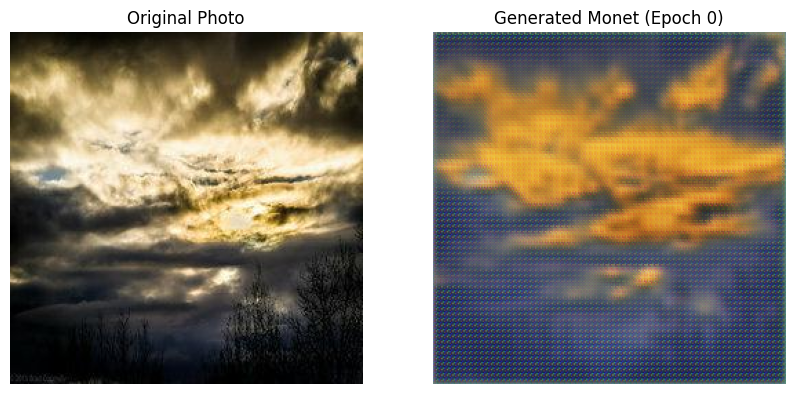

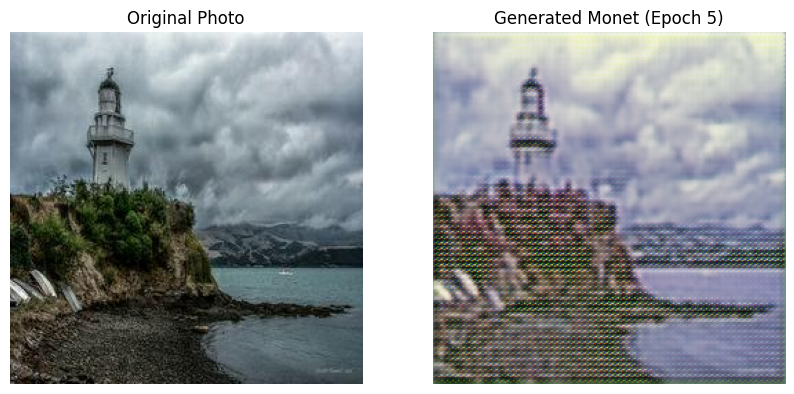

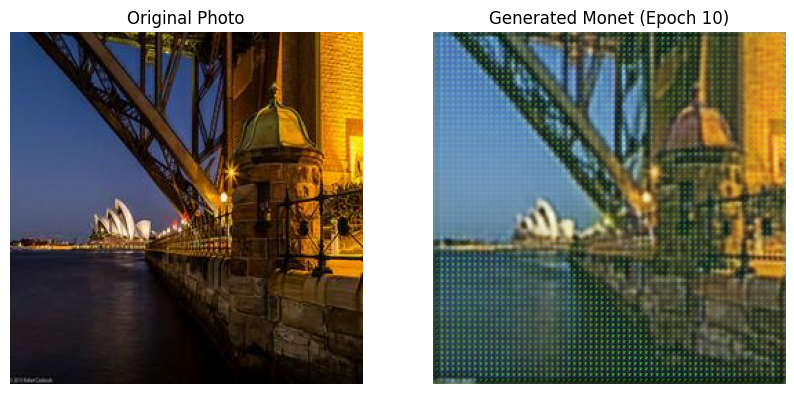

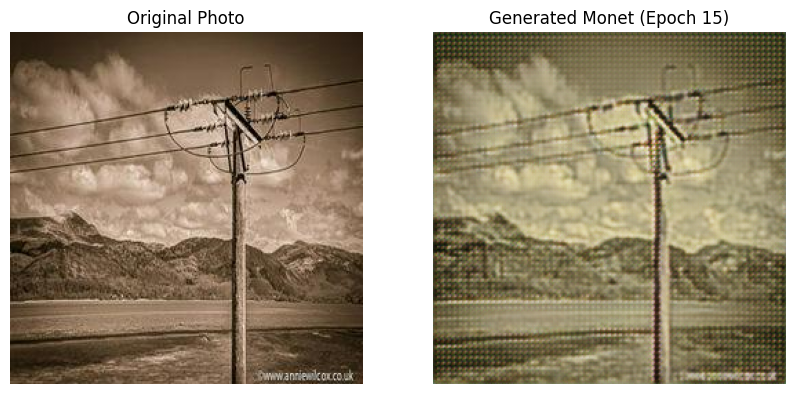

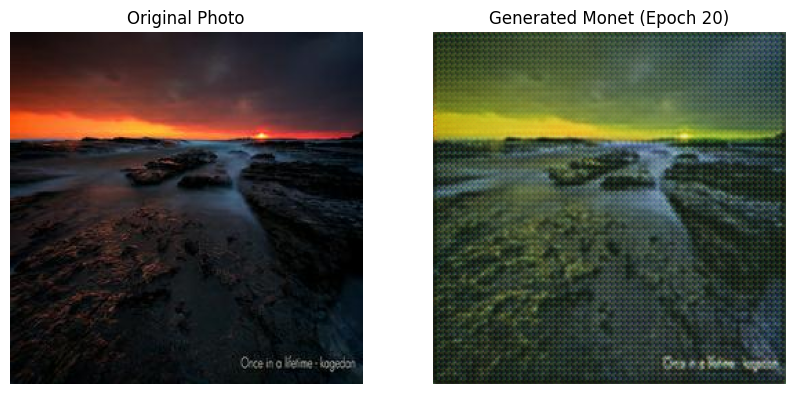

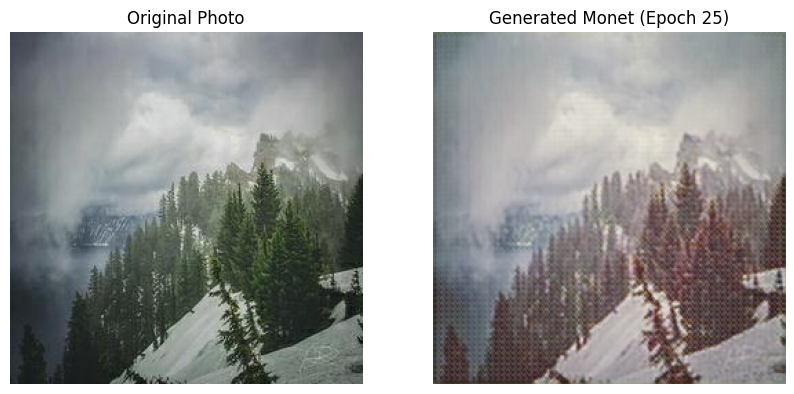

In [6]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, 4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, 4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 64, 4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1),
            nn.Tanh()
        )
    def forward(self, x): return self.net(x)

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 1, 4, padding=1),
            nn.Sigmoid()
        )
    def forward(self, x): return self.net(x)

class ImageDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.transform = transforms.Compose([
            transforms.Resize(256),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])
        self.files = os.listdir(root_dir)
        
    def __getitem__(self, idx):
        img = Image.open(os.path.join(self.root_dir, self.files[idx]))
        return self.transform(img)

    def __len__(self):
        return len(self.files)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
G_p2m = Generator().to(device)
G_m2p = Generator().to(device)
D_m = Discriminator().to(device)
D_p = Discriminator().to(device)

monet_data = ImageDataset('/kaggle/input/gan-getting-started/monet_jpg')
photo_data = ImageDataset('/kaggle/input/gan-getting-started/photo_jpg')
monet_loader = DataLoader(monet_data, batch_size=1, shuffle=True)
photo_loader = DataLoader(photo_data, batch_size=1, shuffle=True)

g_opt = torch.optim.Adam(list(G_p2m.parameters()) + list(G_m2p.parameters()), lr=0.0002)
d_opt = torch.optim.Adam(list(D_m.parameters()) + list(D_p.parameters()), lr=0.0002)

mse_loss = nn.MSELoss()
l1_loss = nn.L1Loss()

num_epochs = 30
for epoch in range(num_epochs):
    for monet_real, photo_real in zip(monet_loader, photo_loader):
        monet_real, photo_real = monet_real.to(device), photo_real.to(device)
        g_opt.zero_grad()
        fake_monet = G_p2m(photo_real)
        fake_photo = G_m2p(monet_real)
        cycle_photo = G_m2p(fake_monet)
        cycle_monet = G_p2m(fake_photo)
        g_loss = (mse_loss(D_m(fake_monet), torch.ones_like(D_m(fake_monet))) +
                 l1_loss(cycle_photo, photo_real) * 10 +
                 l1_loss(cycle_monet, monet_real) * 10)
        g_loss.backward()
        g_opt.step()
        d_opt.zero_grad()
        d_loss = (mse_loss(D_m(monet_real), torch.ones_like(D_m(monet_real))) +
                 mse_loss(D_m(fake_monet.detach()), torch.zeros_like(D_m(fake_monet))))
        d_loss.backward()
        d_opt.step()
    
    if epoch % 5 == 0:
        plt.figure(figsize=(10,5))
        plt.subplot(1,2,1)
        plt.imshow(photo_real[0].cpu().permute(1,2,0) * 0.5 + 0.5)
        plt.title('Original Photo')
        plt.axis('off')
        plt.subplot(1,2,2)
        plt.imshow(fake_monet[0].detach().cpu().permute(1,2,0) * 0.5 + 0.5)
        plt.title(f'Generated Monet (Epoch {epoch})')
        plt.axis('off')
        plt.show()

These results seem to somewhat emulate the original photo but there is a distinct grid pattern, some colors are wrong and overall it doesn't give a "monet" feel. Let's try tuning some hyperparameters such as increasing generator capacity, reducing the learning rate, increasing batch size and adjusting loss weight. These changes should slow down the learning learning so that we can stabilize the model and give it more time to learn. It should also produce more stable gradients and preserve the image structure.

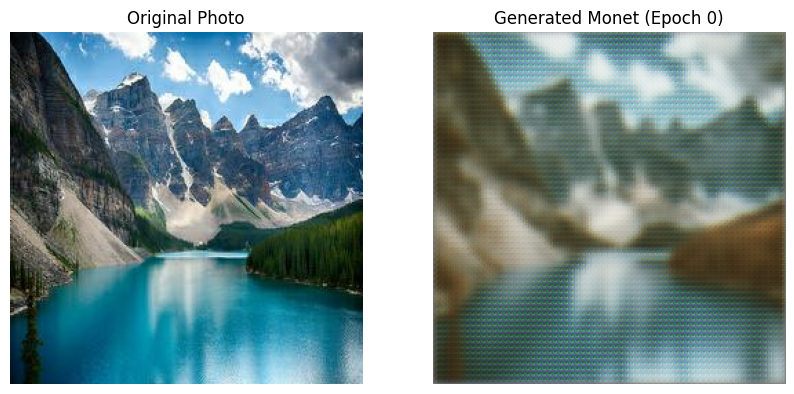

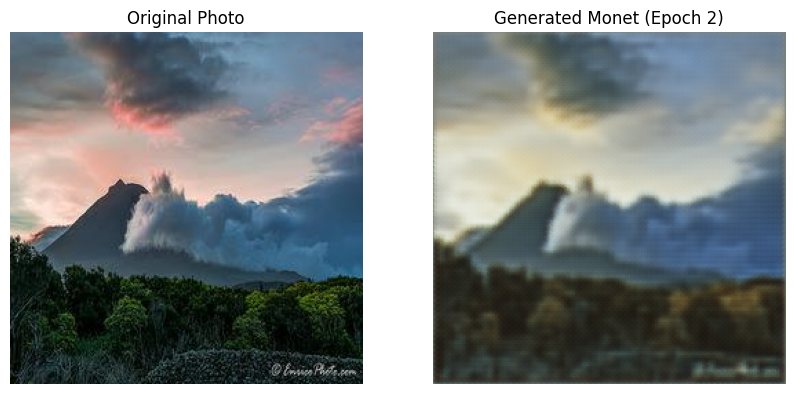

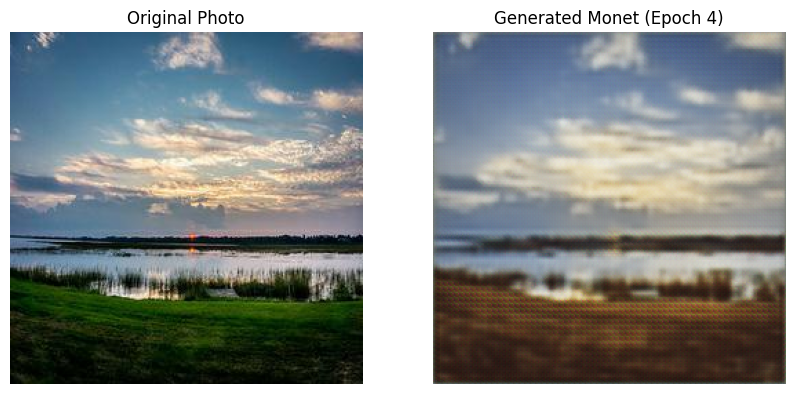

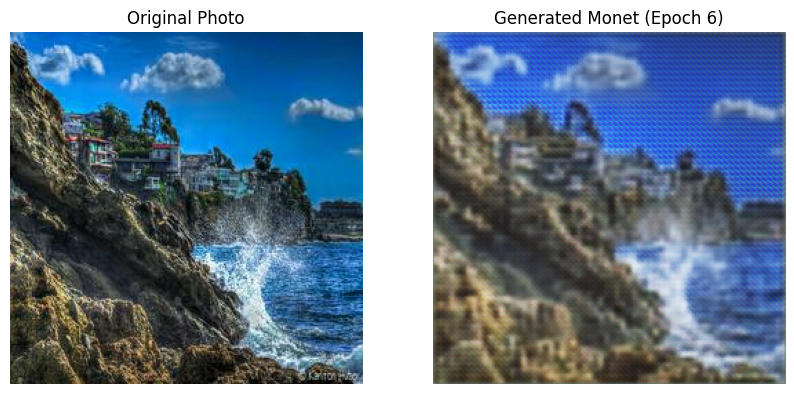

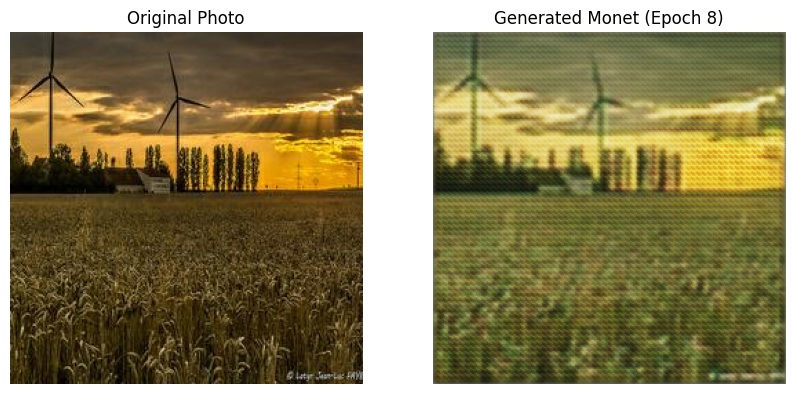

In [7]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 128, 4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 128, 4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 128, 4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 3, 4, stride=2, padding=1),
            nn.Tanh()
        )
    def forward(self, x): return self.net(x)

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 1, 4, padding=1),
            nn.Sigmoid()
        )
    def forward(self, x): return self.net(x)

class ImageDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.transform = transforms.Compose([
            transforms.Resize(256),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])
        self.files = os.listdir(root_dir)

    def __getitem__(self, idx):
        img = Image.open(os.path.join(self.root_dir, self.files[idx]))
        return self.transform(img)

    def __len__(self):
        return len(self.files)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
G_p2m = Generator().to(device)
G_m2p = Generator().to(device)
D_m = Discriminator().to(device)
D_p = Discriminator().to(device)

monet_data = ImageDataset('/kaggle/input/gan-getting-started/monet_jpg')
photo_data = ImageDataset('/kaggle/input/gan-getting-started/photo_jpg')
monet_loader = DataLoader(monet_data, batch_size=4, shuffle=True)
photo_loader = DataLoader(photo_data, batch_size=4, shuffle=True)

g_opt = torch.optim.Adam(list(G_p2m.parameters()) + list(G_m2p.parameters()), lr=0.0001)
d_opt = torch.optim.Adam(list(D_m.parameters()) + list(D_p.parameters()), lr=0.0001)

mse_loss = nn.MSELoss()
l1_loss = nn.L1Loss()

num_epochs = 10
for epoch in range(num_epochs):
    for monet_real, photo_real in zip(monet_loader, photo_loader):
        monet_real, photo_real = monet_real.to(device), photo_real.to(device)
        g_opt.zero_grad()
        fake_monet = G_p2m(photo_real)
        fake_photo = G_m2p(monet_real)
        cycle_photo = G_m2p(fake_monet)
        cycle_monet = G_p2m(fake_photo)
        g_loss = (mse_loss(D_m(fake_monet), torch.ones_like(D_m(fake_monet))) * 2 +
                 l1_loss(cycle_photo, photo_real) * 15 +
                 l1_loss(cycle_monet, monet_real) * 15)
        g_loss.backward()
        g_opt.step()
        d_opt.zero_grad()
        d_loss = (mse_loss(D_m(monet_real), torch.ones_like(D_m(monet_real))) +
                 mse_loss(D_m(fake_monet.detach()), torch.zeros_like(D_m(fake_monet))))
        d_loss.backward()
        d_opt.step()
    
    if epoch % 2 == 0:
        plt.figure(figsize=(10,5))
        plt.subplot(1,2,1)
        plt.imshow(photo_real[0].cpu().permute(1,2,0) * 0.5 + 0.5)
        plt.title('Original Photo')
        plt.axis('off')
        
        plt.subplot(1,2,2)
        plt.imshow(fake_monet[0].detach().cpu().permute(1,2,0) * 0.5 + 0.5)
        plt.title(f'Generated Monet (Epoch {epoch})')
        plt.axis('off')
        plt.show()

The tuning showed some improvements. The colors are more natural, and the composition gives more of a "monet" feel rather than a filtered image. However there are still significant issue such as the grid pattern, the images are blurry and its not quite as painterly as we would like it to be. Let's try creating a pix2pix model to see if it gives us better results.

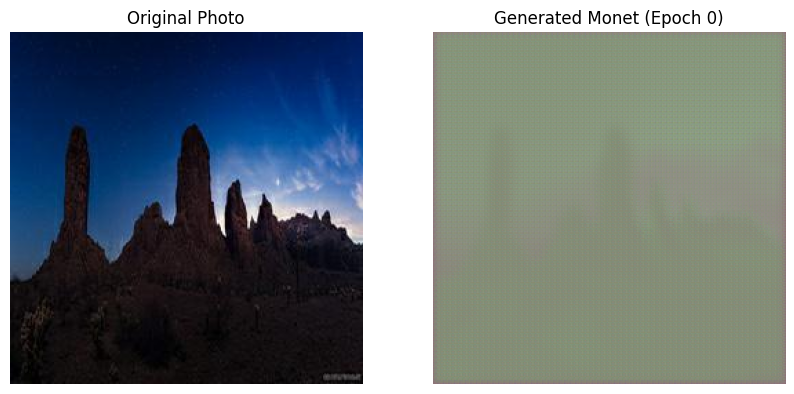

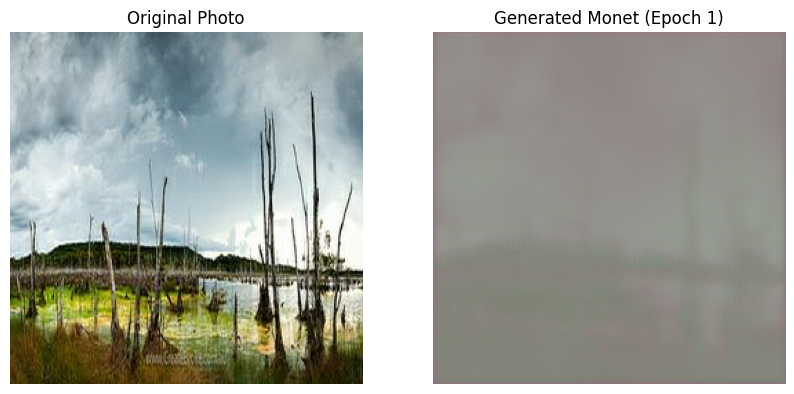

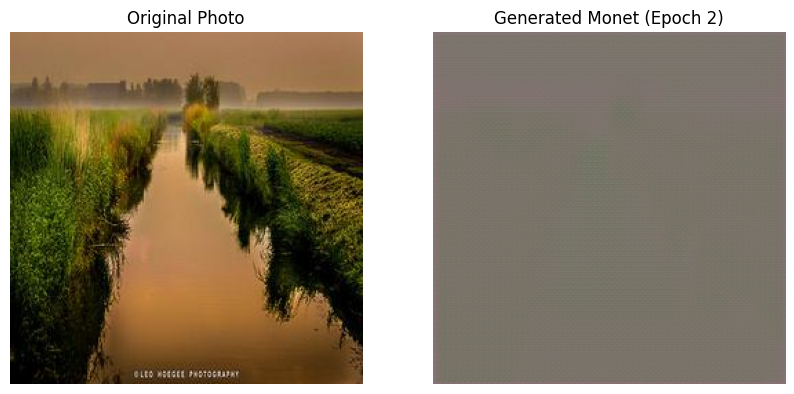

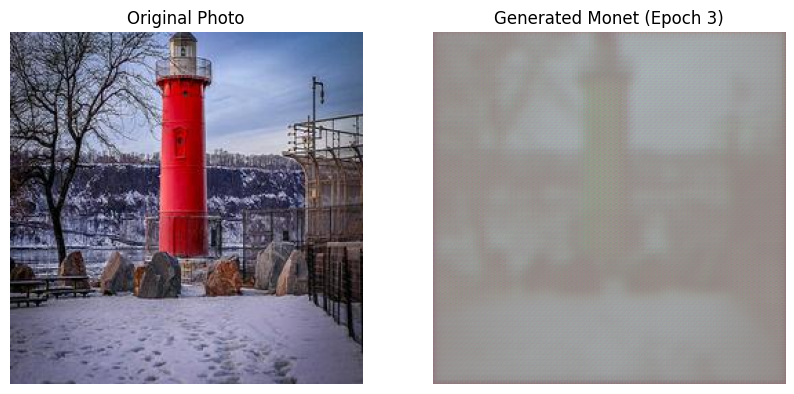

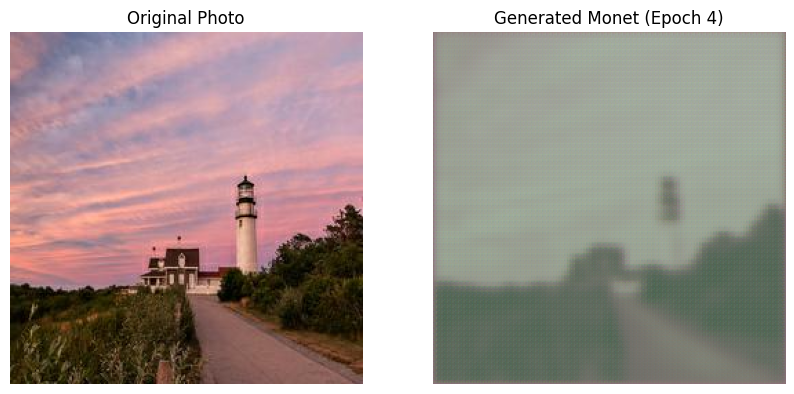

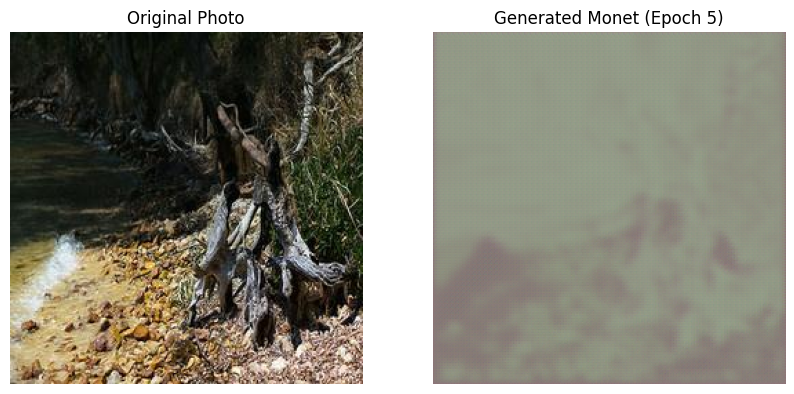

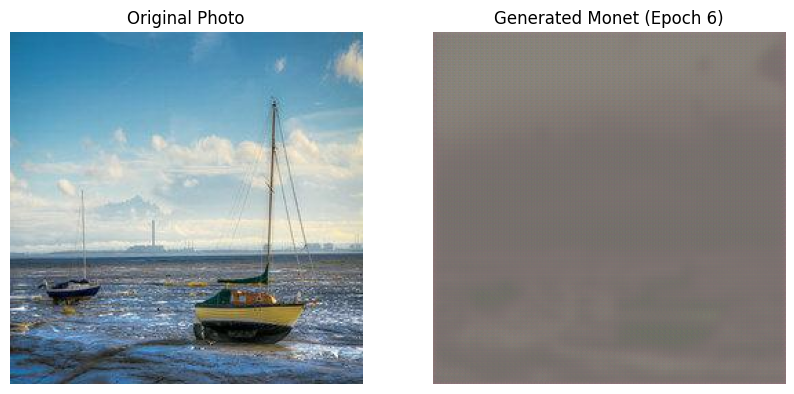

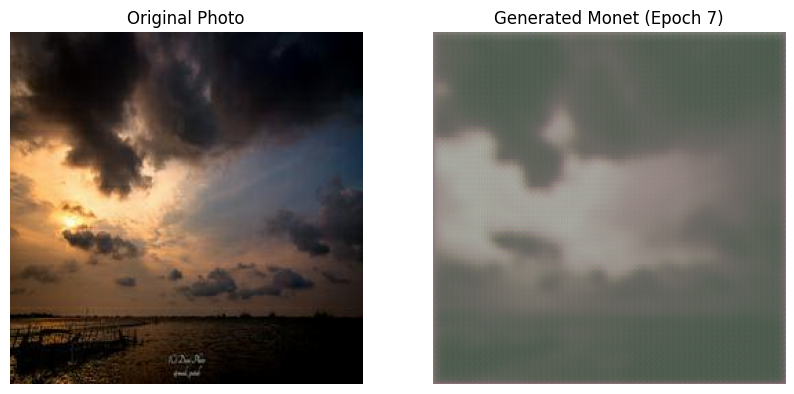

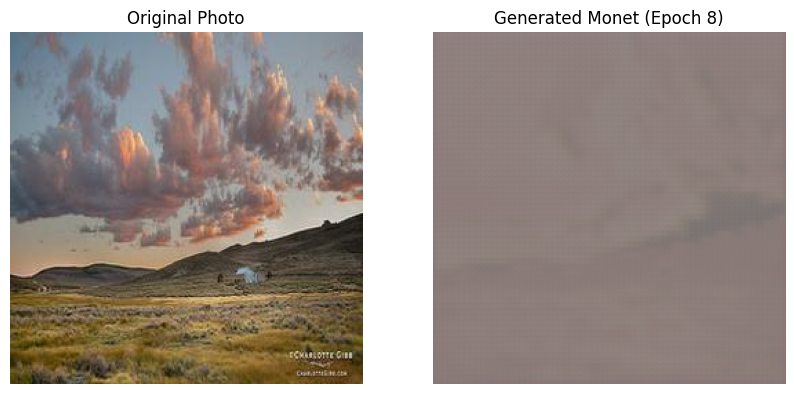

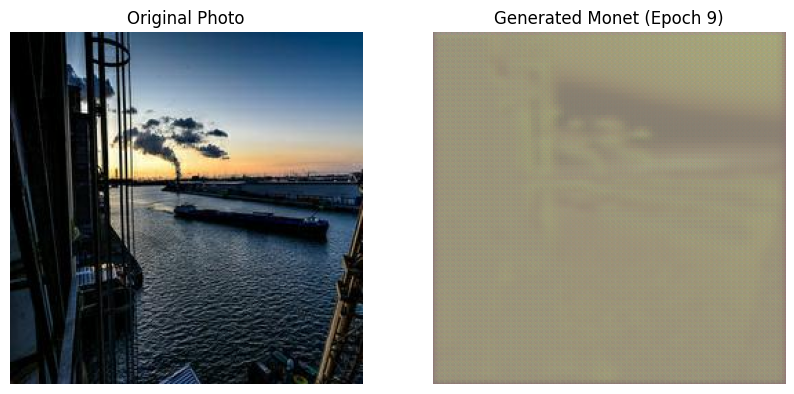

In [6]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, 4, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 64, 4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 64, 4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1),
            nn.Tanh()
        )
    def forward(self, x): return self.net(x)

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(6, 64, 4, stride=2, padding=1),  # Changed input to 6 channels
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 1, 4, padding=1),
            nn.Sigmoid()
        )
    def forward(self, x, y): return self.net(torch.cat([x, y], dim=1))

class ImageDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.transform = transforms.Compose([
            transforms.Resize(256),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])
        self.files = os.listdir(root_dir)

    def __getitem__(self, idx):
        img = Image.open(os.path.join(self.root_dir, self.files[idx]))
        return self.transform(img)

    def __len__(self):
        return len(self.files)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
G = Generator().to(device)
D = Discriminator().to(device)

monet_data = ImageDataset('/kaggle/input/gan-getting-started/monet_jpg')
photo_data = ImageDataset('/kaggle/input/gan-getting-started/photo_jpg')
monet_loader = DataLoader(monet_data, batch_size=4, shuffle=True)
photo_loader = DataLoader(photo_data, batch_size=4, shuffle=True)

g_opt = torch.optim.Adam(G.parameters(), lr=0.0002)
d_opt = torch.optim.Adam(D.parameters(), lr=0.0002)

num_epochs = 10
for epoch in range(num_epochs):
    for monet_real, photo_real in zip(monet_loader, photo_loader):
        monet_real, photo_real = monet_real.to(device), photo_real.to(device)
        g_opt.zero_grad()
        fake_monet = G(photo_real)
        g_loss = (torch.mean((D(photo_real, fake_monet) - 1)**2) + 
                 torch.mean((fake_monet - monet_real)**2) * 10)  # Added L1-like loss
        
        g_loss.backward()
        g_opt.step()
        d_opt.zero_grad()
        d_loss = (torch.mean((D(photo_real, monet_real) - 1)**2) + 
                 torch.mean(D(photo_real, fake_monet.detach())**2)) * 0.5
        
        d_loss.backward()
        d_opt.step()
    if epoch % 1 == 0:
        plt.figure(figsize=(10,5))
        plt.subplot(1,2,1)
        plt.imshow(photo_real[0].cpu().permute(1,2,0) * 0.5 + 0.5)
        plt.title('Original Photo')
        plt.axis('off')
        
        plt.subplot(1,2,2)
        plt.imshow(fake_monet[0].detach().cpu().permute(1,2,0) * 0.5 + 0.5)
        plt.title(f'Generated Monet (Epoch {epoch})')
        plt.axis('off')
        plt.show()

Unfortunately the pix2pix model seems to learn far too slow and simply produces greyed out images, proving that cycleGAN is better in this scenario.

In conclusion it would most likely be better to focus on the cycleGAN model and keep modifying the hyperparameters and even the model itself so that it can produce images that look like genuine Monets. Some suggestions for improvement can be seen in the Let's Get Started tutorial by Amy Jang wherein she uses a more sophisticated generator architecture with more channels. She also implements a different learning rate and a batch size of only one, suggesting our original batch sizing was correct.